# **Data mining techniques for the analysis of international air traffic, focused on the United States departures between 1990 and 2020 (before the covid-19 pandemic)**

### **Imports and Configuration**

In [41]:
%pip install geopy
%pip install plotly
%pip install sklearn
!{sys.executable} -m pip install folium

You should consider upgrading via the 'c:\Users\sergi\AppData\Local\Programs\Python\Python39\python.exe -m pip install --upgrade pip' command.



Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\sergi\AppData\Local\Programs\Python\Python39\python.exe -m pip install --upgrade pip' command.


Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'c:\Users\sergi\AppData\Local\Programs\Python\Python39\python.exe -m pip install --upgrade pip' command.


You should consider upgrading via the 'c:\Users\sergi\AppData\Local\Programs\Python\Python39\python.exe -m pip install --upgrade pip' command.


In [42]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt
from operator import itemgetter
from sklearn.cluster import AgglomerativeClustering
from sklearn import metrics
from IPython.display import display, Latex
from geopy.geocoders import Nominatim

### **Import the data**

In [43]:
# importing the datasets
dep_report = pd.read_csv('data/International_Report_Departures.csv')
pass_report = pd.read_csv('data/International_Report_Passengers.csv')
iata_codes = pd.read_csv('data/IATA codes.csv')
accidentality = pd.read_csv('data/Airplane_Crashes_and_Fatalities_Since_1908.csv')
usg_apt_locations = pd.read_csv('data/usg_apt_locations.csv')
fg_apt_locations = pd.read_csv('data/fg_apt_locations.csv')

In [44]:
dep_report.columns.values

array(['data_dte', 'Year', 'Month', 'usg_apt_id', 'usg_apt', 'usg_wac',
       'fg_apt_id', 'fg_apt', 'fg_wac', 'airlineid', 'carrier',
       'carriergroup', 'type', 'Scheduled', 'Charter', 'Total'],
      dtype=object)

In [45]:
dep_report.head(5)

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2006,2006,5,12016,GUM,5,13162,MAJ,844,20177,PFQ,1,Departures,0,10,10
1,05/01/2003,2003,5,10299,ANC,1,13856,OKO,736,20007,5Y,1,Departures,0,15,15
2,03/01/2007,2007,3,10721,BOS,13,12651,KEF,439,20402,GL,1,Departures,0,1,1
3,12/01/2004,2004,12,11259,DAL,74,16271,YYZ,936,20201,AMQ,1,Departures,0,1,1
4,05/01/2009,2009,5,13303,MIA,33,11075,CMW,219,21323,5L,0,Departures,0,20,20


In [46]:
pass_report.head(5)

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2014,2014,5,14492,RDU,36,11032,CUN,148,19534,AM,0,Passengers,0,315,315
1,06/01/2007,2007,6,13204,MCO,33,16085,YHZ,951,20364,C6,0,Passengers,0,683,683
2,12/01/2005,2005,12,11433,DTW,43,10411,AUA,277,20344,RD,1,Passengers,0,1010,1010
3,04/01/2003,2003,4,13487,MSP,63,16304,ZIH,148,20204,MG,1,Passengers,0,508,508
4,12/01/2005,2005,12,12016,GUM,5,11138,CRK,766,20312,TZ,1,Passengers,0,76,76


## **Statistics**

In [47]:
def orderDataAsTimeSeries(data):
  data = data.sort_values(['Year', 'Month'], ignore_index=True)
  data['time'] = np.arange(len(data))
  return data

In [48]:
def groupRegistersByAttributes(data, attributes):
  data = data.groupby(attributes)
  return data[['Scheduled', 'Charter', 'Total']]

In [49]:
dep_report = orderDataAsTimeSeries(dep_report)
pass_report = orderDataAsTimeSeries(pass_report)

In [50]:
# Get the data grouped by date to analize monthly and flattening the multi-index dataframes 
dep_serie = groupRegistersByAttributes(dep_report, ['Year', 'Month']).sum().reset_index()
pass_serie = groupRegistersByAttributes(pass_report, ['Year', 'Month']).sum().reset_index()
# Depreciating the start of the pandemic
dep_serie = dep_serie.iloc[0:len(dep_serie) - 1]
pass_serie = pass_serie.iloc[0:len(pass_serie) - 1]

### Mean and Standard deviation by Month and Year

In [51]:
# Data for months
dep_total_stat = dep_serie['Total'].describe()
pass_total_stat = pass_serie['Total'].describe()
print("ABOUT NUMBER OF DEPARTURES PER MONTH\n")
print(dep_total_stat.apply("{0:.3f}".format))
print("_______________________________________")
print("ABOUT NUMBER OF PASSENGERS PER MONTH\n")
print(pass_total_stat.apply("{0:.3f}".format))

ABOUT NUMBER OF DEPARTURES PER MONTH

count       362.000
mean     107735.704
std       28398.886
min       49264.000
25%       82538.000
50%      113556.500
75%      128717.500
max      165616.000
Name: Total, dtype: object
_______________________________________
ABOUT NUMBER OF PASSENGERS PER MONTH

count         362.000
mean     12533078.707
std       4030832.916
min       4672216.000
25%       9478129.500
50%      12045771.000
75%      14994987.250
max      24314837.000
Name: Total, dtype: object


In [52]:
# Data for months
dep_yearly = dep_serie.groupby('Year')['Total'].sum().describe()
pass_yearly = pass_serie.groupby('Year')['Total'].sum().describe()
print("ABOUT NUMBER OF DEPARTURES PER YEAR\n")
print(dep_yearly.apply("{0:.3f}".format))
print("_______________________________________")
print("ABOUT NUMBER OF PASSENGERS PER YEAR\n")
print(pass_yearly.apply("{0:.3f}".format))

ABOUT NUMBER OF DEPARTURES PER YEAR

count         31.000
mean     1258075.000
std       378083.571
min       268265.000
25%       963381.000
50%      1399579.000
75%      1513884.000
max      1808369.000
Name: Total, dtype: object
_______________________________________
ABOUT NUMBER OF PASSENGERS PER YEAR

count           31.000
mean     146354015.871
std       49322936.096
min       34919798.000
25%      116786215.000
50%      143711273.000
75%      170117570.000
max      244063957.000
Name: Total, dtype: object


### Linear trend

In [53]:
def displayTrendLatex(coef):
  coef = np.flip(coef)
  poly = ""
  exp = {0: '', 1: 'x'}
  for i in range(len(coef)):
    new_term = 'x^{%s}' % i if i > 1 else exp[i]
    poly = '%s{%s}%s %s' % (poly, coef[i], new_term, '' if (i == len(coef)-1 or coef[i+1] < 0) else '+')
  poly = '$%s$' % poly
  print("Trend: ")
  display(Latex(f'{poly}'))

In [54]:
def findTrend(x, y, degree):
  trend = np.polyfit(x, y, degree)
  trend_poly = np.poly1d(trend)
  displayTrendLatex(trend)
  return trend_poly

In [55]:
def estimateTotal(model, month, year):
  initYear = 1990
  monthNumber = (year - initYear)*12 + month
  return model(monthNumber)

### Monthly graph

In [56]:
def graphTotalPerMonth(df_serie, title='', trend_poly=0):
  x_axis = np.arange(1990, 2021, step=5)
  # create an index for each tick position
  x_sep = np.arange(0, 363, step=60)

  # Finding a linear trend
  x = df_serie.index
  y = df_serie['Total']
  # Graphing
  plt.rcParams["figure.figsize"] = (15, 4)
  
  plt.subplot(1, 2, 1)
  plt.plot(x, y)
  plt.plot(x, trend_poly(x), c='r')
  plt.xticks(x_sep, x_axis)
  plt.legend(['amount', 'trend'])

  plt.subplot(1, 2, 2)
  plt.scatter(x, y, s=10, c='orange')
  plt.plot(x, trend_poly(x), c='r')
  plt.xticks(x_sep, x_axis)
  plt.legend(['trend', 'amount'])

  plt.suptitle(title)

For departures

Trend: 


<IPython.core.display.Latex object>

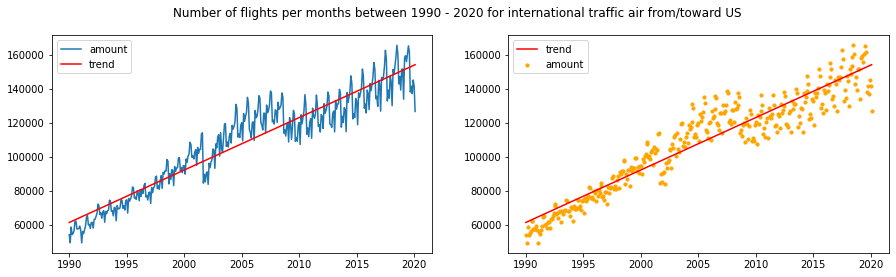

In [57]:
dep_trend_poly = findTrend(dep_serie.index, dep_serie['Total'], 1)
graphTotalPerMonth(dep_serie, 'Number of flights per months between 1990 - 2020 for international traffic air from/toward US', dep_trend_poly)

For passengers

Trend: 


<IPython.core.display.Latex object>

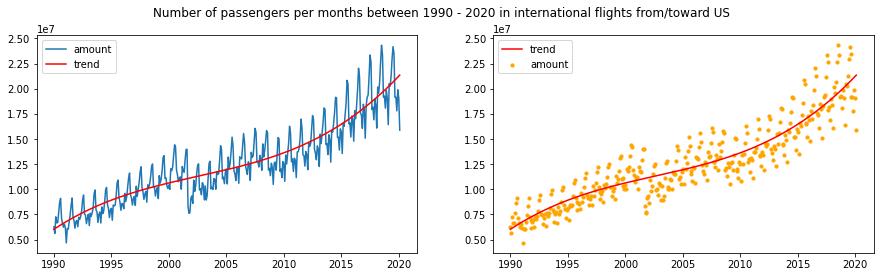

In [58]:
pass_trend_poly = findTrend(pass_serie.index, pass_serie['Total'], 3)
graphTotalPerMonth(pass_serie, 'Number of passengers per months between 1990 - 2020 in international flights from/toward US', pass_trend_poly)

#### Estimating total of flights and passengers for date

In [59]:
# Change the value for the month and year and run the cell
month = 5
year = 2022
print("Total estimated for  %s/%s:" % (month, year))
print("   flights: %s" % round(estimateTotal(dep_trend_poly, month, year)))
print("   passengers: %s" % round(estimateTotal(pass_trend_poly, month, year)))

Total estimated for  5/2022:
   flights: 161368
   passengers: 24478900


### Graphing mean and Standard deviation per Months and Years

In [60]:
# Finding statistics per months and formating the data
def statisticsPerMonths(df_serie):
  df_monthly = df_serie.copy()
  df_monthly['sum'] = df_serie.groupby('Month')['Total'].transform('sum')
  df_monthly['mean'] = df_serie.groupby('Month')['Total'].transform('mean')
  df_monthly['std'] = df_serie.groupby('Month')['Total'].transform('std')
  df_monthly['min'] = df_serie.groupby('Month')['Total'].transform('min')
  df_monthly['max'] = df_serie.groupby('Month')['Total'].transform('max')
  df_monthly = df_monthly[['Month', 'sum', 'mean', 'std', 'min', 'max']].drop_duplicates(subset=['Month'])
  df_monthly['nameMonth'] = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
  df_monthly = df_monthly.reindex(columns=['Month', 'sum', 'nameMonth','mean','std','min','max'])
  return df_monthly

In [61]:
def statisticsPerYears(df_serie):
  df_yearly = df_serie.copy()
  df_yearly['sum'] = df_serie.groupby('Year')['Total'].transform('sum')
  df_yearly = df_yearly[['Year', 'sum']].drop_duplicates(subset=['Year'])
  return df_yearly

In [62]:
def graphStatisticsPerPeriod(df_period, attribute, x_label='', y_label=''):
  not_stat_attributes = [attribute, 'nameMonth', 'sum'] if (attribute == 'Month') else [attribute]
  statistics = df_period.drop(not_stat_attributes, axis=1).columns
  colors = ['#1EBFB0', '#59F710', '#D68910', '#D666B4']
  for i in range(statistics.shape[0]):
    plt.plot(df_period[attribute], df_period[statistics[i]], c=colors[i])
  plt.legend(statistics)
  plt.xlabel(x_label, fontsize=12)
  plt.ylabel(y_label, fontsize=12)

In [63]:
def graphStatisticsPerMonths(df_monthly, y_label=''):
  graphStatisticsPerPeriod(df_monthly, attribute='Month', x_label='Month', y_label=y_label)
  plt.xticks(range(1,len(df_monthly['nameMonth']) + 1), df_monthly['nameMonth'])
  plt.grid()

In [64]:
def graphStatisticsPerYears(df_yearly, model, y_label=''):
  graphStatisticsPerPeriod(df_yearly, attribute='Year', x_label='Year', y_label=y_label)
  plt.plot(df_yearly['Year'], model(df_yearly['Year']), c='r')
  plt.legend(['departures', 'trend'])
  plt.grid()

In [65]:
pd.options.display.float_format = '{:.2f}'.format

dep_monthly = statisticsPerMonths(dep_serie)
pass_monthly = statisticsPerMonths(pass_serie)

dep_yearly = statisticsPerYears(dep_serie)
pass_yearly = statisticsPerYears(pass_serie)

Text(0.5, 0.98, 'Statistics per Month')

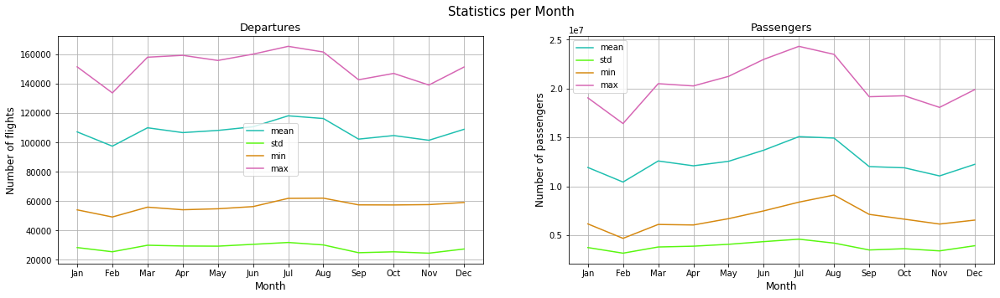

In [66]:
plt.rcParams["figure.figsize"] = (20, 5)
plt.subplot(1, 2, 1)
plt.title('Departures', fontsize=13)
graphStatisticsPerMonths(dep_monthly, y_label='Number of flights')
plt.subplot(1, 2, 2)
plt.title('Passengers', fontsize=13)
graphStatisticsPerMonths(pass_monthly, y_label='Number of passengers')
plt.suptitle("Statistics per Month", fontsize=15)

Trend: 


<IPython.core.display.Latex object>

Trend: 


<IPython.core.display.Latex object>

Text(0.5, 0.98, 'Statistics per Year')

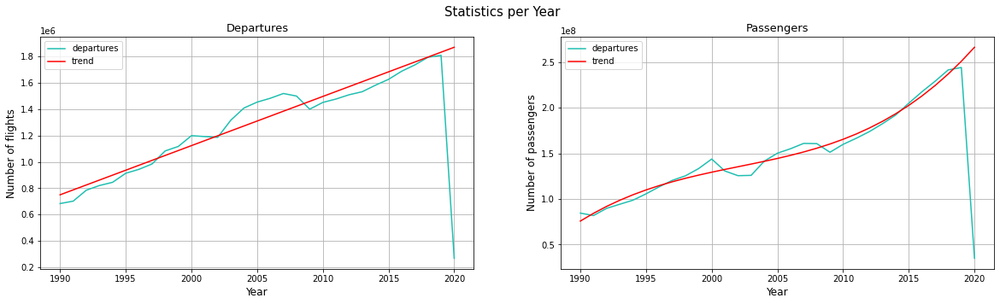

In [67]:
# Droping year 2020 because of pandemic
x_dep_year = dep_yearly['Year'].iloc[0:len(dep_yearly)-1]
y_dep_year = dep_yearly['sum'].iloc[0:len(dep_yearly)-1]
x_pass_year = pass_yearly['Year'].iloc[0:len(dep_yearly)-1]
y_pass_year = pass_yearly['sum'].iloc[0:len(dep_yearly)-1]

# Finding trends for departures and passengers
dep_trend_poly_yearly = findTrend(x_dep_year, y_dep_year, 1)
pass_trend_poly_yearly = findTrend(x_pass_year, y_pass_year, 3)

plt.rcParams["figure.figsize"] = (20, 5)
plt.subplot(1, 2, 1)
plt.title('Departures', fontsize=13)
graphStatisticsPerYears(dep_yearly, dep_trend_poly_yearly, y_label='Number of flights')
plt.subplot(1, 2, 2)
plt.title('Passengers', fontsize=13)
graphStatisticsPerYears(pass_yearly, pass_trend_poly_yearly, y_label='Number of passengers')
plt.suptitle("Statistics per Year", fontsize=15)

#### Estimating total of flights and passengers for year

In [68]:
# Change the value for the year and run the cell
year = 2015
print("Total estimated for %s:" % (year))
print("   flights: %s" % round(dep_trend_poly_yearly(year)))
print("   passengers: %s" % round(pass_trend_poly_yearly(year)))

Total estimated for 2015:
   flights: 1682953
   passengers: 202538784


## **Clustering by Months**

In [69]:
def normalizingDataValues(df_serie):
  # Normalizing variables to make clustering
  df_serie_clustering = df_serie.copy()
  # total
  df_serie_clustering['avg_year_total'] = df_serie_clustering.groupby('Year')['Total'].transform('mean')
  df_serie_clustering['std_year_total'] = df_serie_clustering.groupby('Year')['Total'].transform('std')
  # scheduled
  df_serie_clustering['avg_year_scheduled'] = df_serie_clustering.groupby('Year')['Scheduled'].transform('mean')
  df_serie_clustering['std_year_scheduled'] = df_serie_clustering.groupby('Year')['Scheduled'].transform('std')
  # charter
  df_serie_clustering['avg_year_charter'] = df_serie_clustering.groupby('Year')['Charter'].transform('mean')
  df_serie_clustering['std_year_charter'] = df_serie_clustering.groupby('Year')['Charter'].transform('std')

  normalized_total = []
  normalized_scheduled = []
  normalized_charter = []
  for i in range(len(df_serie_clustering['Year'])):
    row = df_serie_clustering.iloc[i]
    
    normalized_value_total = (row.Total - row.avg_year_total) / row.std_year_total
    normalized_total.append(normalized_value_total)

    normalized_value_scheduled = (row.Scheduled - row.avg_year_scheduled) / row.std_year_scheduled
    normalized_scheduled.append(normalized_value_scheduled)
    
    normalized_value_charter = (row.Charter - row.avg_year_charter) / row.std_year_charter
    normalized_charter.append(normalized_value_charter)

  df_serie_clustering['normalized_total'] = normalized_total
  df_serie_clustering['normalized_scheduled'] = normalized_scheduled
  df_serie_clustering['normalized_charter'] = normalized_charter
  return df_serie_clustering

In [70]:
def graphingClusters(predicted, ground_truth, X_dep, title=""):
  colors = np.array(['#e6194b', '#3cb44b', '#ffe119', '#4363d8', '#f58231', '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#fabebe', '#008080', '#e6beff'])
  plt.rcParams["figure.figsize"] = (10, 5)

  plt.subplot(1, 2, 1)
  plt.scatter(x=X_dep['normalized_scheduled'], y=X_dep['normalized_charter'], c=colors[predicted.labels_], s=20, alpha=0.5)
  plt.xlabel('Scheduled')
  plt.ylabel('Charter')
  plt.title('graph from clustering')

  plt.subplot(1, 2, 2)
  plt.scatter(x=X_dep['normalized_scheduled'], y=X_dep['normalized_charter'], c=colors[ground_truth], s=20, alpha=0.5)
  plt.xlabel('Scheduled')
  plt.ylabel('Charter')
  plt.title('graph from ground-truth')

  plt.suptitle('Clustering with normalized values for ' + title, fontsize=15)

### for departures

In [71]:
dep_serie_clustering = normalizingDataValues(dep_serie)
X_dep = dep_serie_clustering.loc[:, ['normalized_scheduled', 'normalized_charter']]

ground_truth_dep = dep_serie['Month'].values - 1

In [72]:
# Adjusting the model
predicted_dep = AgglomerativeClustering(n_clusters=12, affinity='euclidean')
predicted_dep.fit(X_dep)

AgglomerativeClustering(n_clusters=12)

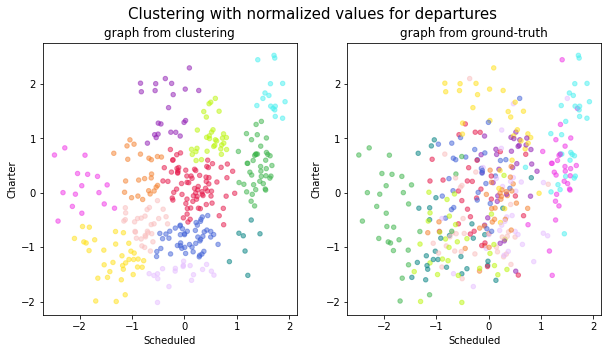

In [73]:
# Graphing the clusters fitted
graphingClusters(predicted_dep, ground_truth_dep, X_dep, 'departures')

Performance of the clustering

In [74]:
# Adjusted rand score > 0 -> good
print('Adjusted rand score: ', metrics.adjusted_rand_score(ground_truth_dep, predicted_dep.labels_))
# Adjusted mutual info score >> 0 -> good
print('Adjusted mutual info score: ', metrics.adjusted_mutual_info_score(ground_truth_dep, predicted_dep.labels_))

Adjusted rand score:  0.18988614085911187
Adjusted mutual info score:  0.35623963787551477


### for passengers

In [75]:
pass_serie_clustering = normalizingDataValues(pass_serie)
X_pass = pass_serie_clustering.loc[:, ['normalized_scheduled', 'normalized_charter']]

ground_truth_pass = pass_serie['Month'].values - 1

In [76]:
# Adjusting the model
predicted_pass = AgglomerativeClustering(n_clusters=12, affinity='euclidean')
predicted_pass.fit(X_pass)

AgglomerativeClustering(n_clusters=12)

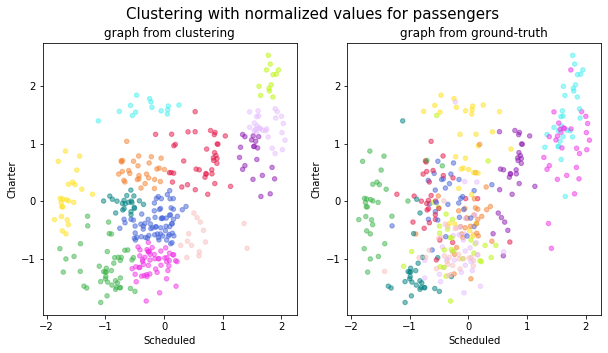

In [77]:
# Graphing the clusters fitted
graphingClusters(predicted_pass, ground_truth_pass, X_pass, 'passengers')

Performance of the clustering

In [78]:
# Adjusted rand score > 0 -> good
print('Adjusted rand score: ', metrics.adjusted_rand_score(ground_truth_pass, predicted_pass.labels_))
# Adjusted mutual info score >> 0 -> good
print('Adjusted mutual info score: ', metrics.adjusted_mutual_info_score(ground_truth_pass, predicted_pass.labels_))

Adjusted rand score:  0.2866069576509507
Adjusted mutual info score:  0.474018952393015


### Observation
There is a good relation between the number of departures and the month to make clusters. It's not perfect but it can be seen easily.

## **Map**

In [79]:
# counting the airport departures and group them in a single dataframe
grouped_usg = dep_report.groupby(['usg_apt']).size().reset_index(name='counts')
ordered_cities_usg = grouped_usg.sort_values(by='counts', ascending=False)

grouped_fg = dep_report.groupby(['fg_apt']).size().reset_index(name='counts')
ordered_cities_fg = grouped_fg.sort_values(by='counts', ascending=False)

In [80]:
usg_codigosIATA = dep_report.groupby(['usg_apt']).size().reset_index(name='counts').usg_apt.unique()
fg_codigosIATA = dep_report.groupby(['fg_apt']).size().reset_index(name='counts').fg_apt.unique()

### Section used to extract the geographical information just the first time to preprocess

In [81]:
def getAirportNameFromIATACode(iataCode):
  dataRow = iata_codes.loc[iata_codes['iataCode'] == iataCode].reset_index()
  if(dataRow.empty == False):
    airportName = dataRow['Airport name'][0] +' '+ dataRow['Location'][0] +' '+ dataRow['Country'][0]
    return airportName

In [82]:
def calc_airport_location(iataCode):
  geolocalizador = Nominatim(user_agent="a@uninorte.edu.co")
  airportName = getAirportNameFromIATACode(iataCode)
  if(airportName):
    location = geolocalizador.geocode(airportName, timeout=15)
    return location

In [83]:
def getAirportFullInformation(iataCode):
  location = calc_airport_location(iataCode)
  dataRow = iata_codes.loc[iata_codes['iataCode'] == iataCode].reset_index()
  if(location and dataRow.empty == False):
    airport_name = dataRow['Airport name'][0]
    iata_code = dataRow['iataCode'][0]
    region = dataRow['Location'][0]
    country = dataRow['Country'][0]
    info = (location.latitude,location.longitude, iata_code, airport_name, region, country)
    return info

In [84]:
def getAirportsListFullInformation(iataCodes, parameter):
  infoList = []
  dep_info = dep_report.groupby([parameter]).sum().reset_index()
  pass_info = pass_report.groupby([parameter]).sum().reset_index()
  for i in range(len(iataCodes)):
    info = getAirportFullInformation(iataCodes[i])
    dep_amount = dep_info[iataCodes[i] == dep_info[parameter]]['Total'].item()
    pass_amount = pass_info[iataCodes[i] == pass_info[parameter]]['Total']
    pass_amount = pass_amount.item() if (len(pass_amount) > 0) else 'No info'
    if(info):
      info = (*info, dep_amount, pass_amount)
      infoList.append(info)
  return infoList

In [85]:
# usg_apt_locations = getAirportsListFullInformation(usg_codigosIATA, 'usg_apt')
# fg_apt_locations = getAirportsListFullInformation(fg_codigosIATA, 'fg_apt')

In [86]:
# # Turning the data into a CSV file
# usg = pd.DataFrame(usg_apt_locations, columns=['longitud', 'latitud', 'iata_code', 'airport_name', 'region', 'country', 'amount'])
# fg = pd.DataFrame(fg_apt_locations, columns=['longitud', 'latitud', 'iata_code', 'airport_name', 'region', 'country', 'amount'])

# usg.to_csv('usg_apt_locations.csv', index=False)
# fg.to_csv('fg_apt_locations.csv', index=False)

### Utils for plotting the departures information

In [87]:
# get the arrays for some variables for a later plotting
def get_airports_info(locations):
  latitud = locations['latitud']
  longitud = locations['longitud']
  iata = locations['iata_code']
  airport_name = locations['airport_name']
  region = locations['region']
  country = locations['country']
  dep_amount = locations['dep_amount']
  pass_amount = locations['pass_amount']
  mediaLat = sum(latitud)/len(latitud)
  mediaLon = sum(longitud)/len(longitud)
  return { "longitud": longitud,
          "latitud": latitud,
          "iata_code": iata,
          "airport_name": airport_name,
          "region": region,
          "country": country,
          "dep_amount": dep_amount,
          "pass_amount": pass_amount,
          "mediaLat": mediaLat,
          "mediaLon": mediaLon }

In [88]:
def format_info(iata, airport_name, region, country, dep_amount, pass_amount):
  info = ("<b>IATA:</b> %s\n"
    "<b>Airport name:</b> %s\n"
    "<b>Location:</b> %s\n"
    "<b>Country:</b> %s\n"
    "<b>Number of flights:</b> %s\n"
    "<b>Number of passengers:</b> %s\n") % (iata, airport_name, region, country, dep_amount, pass_amount)
  return info

In [89]:
# placing each identified airport in the map
def plot_map(airports_info, color='#3388ff', with_weight=True, radius_in=0, opacity_in=0, zoom_start=0):
  longitud, latitud, iata, airport_name, region, country, mediaLat, mediaLon, dep_amount, pass_amount = itemgetter('longitud', 'latitud', 'iata_code', 'airport_name', 'region', 'country', 'mediaLat', 'mediaLon', 'dep_amount', 'pass_amount')(airports_info)
  map = folium.Map(location=[mediaLon, mediaLat], zoom_start=2 if zoom_start == 0 else zoom_start, control_scale= True)
  longitud = longitud.values
  latitud = latitud.values
  iata = iata.values
  airport_name = airport_name.values
  region = region.values
  country = country.values
  dep_amount = dep_amount.values
  pass_amount = pass_amount.values
  for i in range(len(latitud)):
    info = format_info(iata[i], airport_name[i], region[i], country[i], dep_amount[i], pass_amount[i])
    opacity = 0.3 + 0.7*(dep_amount[i]/max(dep_amount)) if (opacity_in == 0) else opacity_in
    radius = 50000 + (80000*(dep_amount[i]/max(dep_amount))) if (radius_in == 0) else radius_in + (radius_in/2*(dep_amount[i]/max(dep_amount)))
    folium.Circle([longitud[i], latitud[i]], radius=radius, popup=info, color=color, opacity=opacity, fill=True).add_to(map)
  return map

### US airports and information

In [90]:
map_usg_apt = plot_map(get_airports_info(usg_apt_locations), "blue")
map_usg_apt

### Foreign airports and information

In [91]:
map_fg_apt = plot_map(get_airports_info(fg_apt_locations), "red")
map_fg_apt

## **Airports with more departures**

In [92]:
# counting the airport departures and group them in a single dataframe
grouped_usg = dep_report.copy()
grouped_usg['counts'] = grouped_usg.groupby(['usg_apt'])['Total'].transform('sum')
grouped_usg = grouped_usg.drop_duplicates(subset=['usg_apt'])
ordered_cities_usg = grouped_usg.sort_values(by=['counts'], ascending=False)

grouped_fg = dep_report.copy()
grouped_fg['counts'] = grouped_fg.groupby(['fg_apt'])['Total'].transform('sum')
grouped_fg = grouped_fg.drop_duplicates(subset=['fg_apt'])
ordered_cities_fg = grouped_fg.sort_values(by=['counts'], ascending=False)

In [93]:
# parameter can be takeoff or landing
def first_n_cities(n, parameter, work_wirh_states=False):
  attribute = 1 if (work_wirh_states) else 0
  if (parameter == "takeoff"):
    ordered_cities = ordered_cities_usg.copy()
    field = "usg_apt"
  else:
    ordered_cities = ordered_cities_fg.copy()
    field = "fg_apt"
  names = []
  iataCode = ordered_cities[field].values
  # Find cities for IATA codes
  for i in range(len(iataCode)):
    try:
      tmp_reg = iata_codes[iata_codes.iataCode == iataCode[i]]
      tmp_reg = tmp_reg['Location'].item().split(",")[attribute]
    except:
      tmp_reg = 'NA'
    names.append(tmp_reg)

  ordered_cities['city'] = names
  ordered_cities['counts'] = ordered_cities.groupby('city')['counts'].transform('sum')
  ordered_cities = ordered_cities.drop_duplicates(subset=['city'])
  ordered_cities = ordered_cities.sort_values(by=['counts'], ascending=False)

  first_n = ordered_cities.head(n=n)
  names = first_n['city']
  return {
    "ordered": ordered_cities,
    "cities": list(map(lambda x: x.replace(" ", "\n"), names)),
    "first_n": first_n
  }

In [94]:
#in case map doesn't work, delete, before run this cell, the map object with >> del map
def bar_most_traffic(n, parameter, color='orange', work_wirh_states=False):
  first_cities = first_n_cities(n, parameter, work_wirh_states)
  kind = 'US' if parameter == 'takeoff' else "Foreign"
  plt.figure(figsize=(14, 5))
  plt.bar(first_cities["cities"], first_cities["first_n"]['counts'], width=0.8, color=color)
  plt.ylabel('Airports %s Number' % kind, fontsize=15)
  plt.xlabel('Airport Code', fontsize=15)
  plt.title('%s Cities for Greater Traffic ' % kind, fontsize=25)
  plt.rcParams.update({'font.size': 10})
  plt.show()

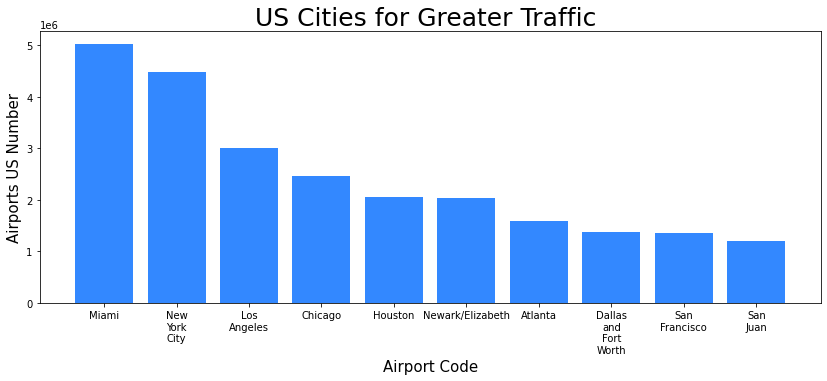

In [95]:
# Change the variable 'n' to get the n first cities with more air traffic in US
# Change the parameter 'work_wirh_states' to True to see the graph by states
n = 10
bar_most_traffic(n, 'takeoff', "#3388ff", work_wirh_states=False)

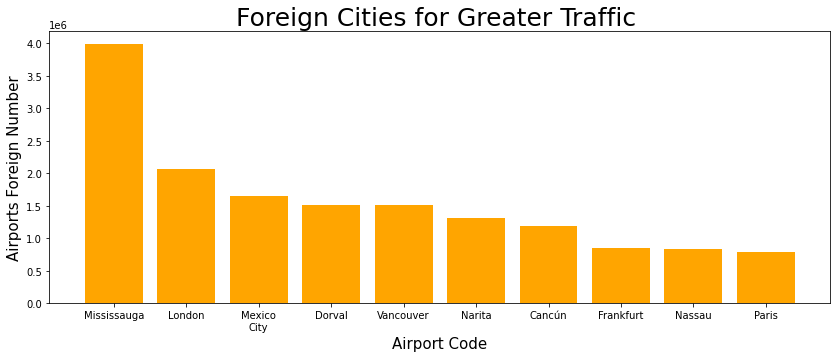

In [96]:
# Change the variable 'n' to get the n first cities with more air traffic out of US
n = 10
bar_most_traffic(n, 'landing', "orange")

## **Departures by aiports**

### All the places an US airport sends flights to, according with its IATA code

In [97]:
#Change the 'aero_salida' variable for the one that you want to know about
aero_salida = 'ATL'
departure_airports = dep_report[dep_report['usg_apt'] == aero_salida]
aiports_to_print = []
for i in range(len(departure_airports)):
  aiports_to_print.append(departure_airports.iloc[i]['fg_apt'])

df_to_print = fg_apt_locations[fg_apt_locations['iata_code'].isin(aiports_to_print)]

m = plot_map(get_airports_info(df_to_print), "red")

local_point = usg_apt_locations[usg_apt_locations['iata_code'] == aero_salida]
info = format_info(local_point.iata_code.item(), local_point.airport_name.item(), local_point.region.item(), local_point.country.item(), local_point.dep_amount.item(), local_point.pass_amount.item())
folium.Circle([local_point.longitud.item(), local_point.latitud.item()], popup=info, radius=100000, color='orange', fill=True).add_to(m)
m

### All the places a foreign airport sends flights to, according with its IATA code

In [98]:
#Change the 'aero' variable for the one that you want to know about
aero = 'CUN'
departure_airports = dep_report[dep_report['fg_apt'] == aero]
departure_airports
aiports_to_print = []
for i in range(len(departure_airports)):
  aiports_to_print.append(departure_airports.iloc[i]['usg_apt'])

df_to_print = usg_apt_locations[usg_apt_locations['iata_code'].isin(aiports_to_print)]
m = plot_map(get_airports_info(df_to_print), "blue")

local_point = fg_apt_locations[fg_apt_locations['iata_code'] == aero]
info = format_info(local_point.iata_code.item(), local_point.airport_name.item(), local_point.region.item(), local_point.country.item(), local_point.dep_amount.item(), local_point.pass_amount.item())
folium.Circle([local_point.longitud.item(), local_point.latitud.item()], popup=info, radius=100000, color='orange', fill=True).add_to(m)
m

## **About international flights between Colombia and United states**

In [99]:
iata_df_colombia = fg_apt_locations[fg_apt_locations['country'] == "Colombia"]
iata_codes_colombia = iata_df_colombia['iata_code'].values

In [100]:
iata_df_colombia

,longitud,latitud,iata_code,airport_name,region,country,dep_amount,pass_amount
49,4.45,-75.77,AXM,El Edén International Airport,Armenia,Colombia,2517,332563
52,4.57,-72.98,BAC,Barranca de Upia Airport,"Barranca de Upia, Meta",Colombia,1,No info
99,4.70,-74.15,BOG,El Dorado International Airport,Bogotá,Colombia,451483,35692418
173,4.76,-75.96,CRC,Santa Ana Airport,Cartago,Colombia,15,5
181,10.44,-75.51,CTG,Rafael Núñez International Airport,Cartagena,Colombia,36133,3839562
237,7.02,-73.81,EJA,Yarigüies Airport,Barrancabermeja,Colombia,1,No info
240,6.22,-75.59,EOH,Olaya Herrera Airport,Medellín,Colombia,1,8
249,5.32,-72.38,EYP,El Alcaraván Airport,Yopal,Colombia,24,No info
260,1.59,-75.56,FLA,Gustavo Artunduaga Paredes Airport,"Florencia, Caquetá",Colombia,4,91
280,3.63,-70.32,GMC,Guerima Airport,Guerima,Colombia,2,124


In [101]:
dep_colombia = dep_report.loc[dep_report['fg_apt'].isin(iata_codes_colombia)]
dep_colombia = orderDataAsTimeSeries(dep_colombia)
pass_colombia = pass_report.loc[pass_report['fg_apt'].isin(iata_codes_colombia)]
pass_colombia = orderDataAsTimeSeries(pass_colombia)

In [102]:
plot_map(get_airports_info(iata_df_colombia), 'purple', radius_in=20000, opacity_in=1, zoom_start=6)

### Airports with more traffic from/toward US

,fg_apt,Scheduled,Charter,Total
2,BOG,400572,50911,451483
4,CTG,35996,137,36133
0,AXM,2517,0,2517
13,PEI,1674,27,1701
14,SMR,68,1,69
10,GPI,58,3,61
7,EYP,0,24,24
3,CRC,15,0,15
8,FLA,0,4,4
12,MGN,0,4,4


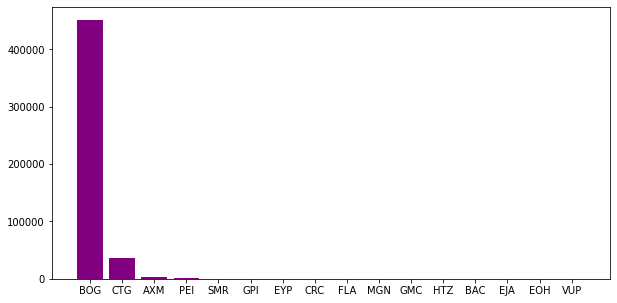

In [103]:
dep_ordered_colombia = groupRegistersByAttributes(dep_colombia, ['fg_apt']).sum().reset_index()
dep_ordered_colombia = dep_ordered_colombia.sort_values('Total', ascending=False)
plt.bar(dep_ordered_colombia['fg_apt'], dep_ordered_colombia['Total'], color='purple')
dep_ordered_colombia

,fg_apt,Scheduled,Charter,Total
1,BOG,35569248,123170,35692418
3,CTG,3836350,3212,3839562
0,AXM,332563,0,332563
9,PEI,40233,47,40280
10,SMR,5222,4,5226
7,GPI,0,402,402
6,GMC,0,124,124
5,FLA,0,91,91
4,EOH,8,0,8
11,VUP,0,6,6


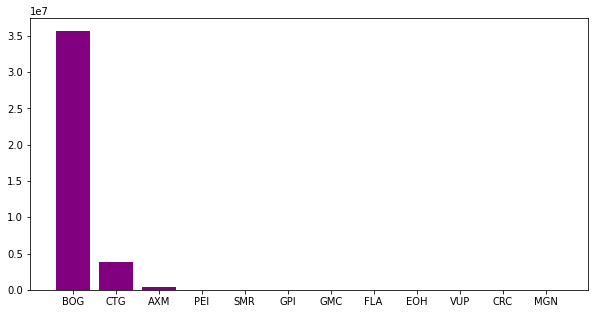

In [104]:
pass_ordered_colombia = groupRegistersByAttributes(pass_colombia, ['fg_apt']).sum().reset_index()
pass_ordered_colombia = pass_ordered_colombia.sort_values('Total', ascending=False)
plt.bar(pass_ordered_colombia['fg_apt'], pass_ordered_colombia['Total'], color='purple')
pass_ordered_colombia

### Trend for number of flights and passengers

Trend: 


<IPython.core.display.Latex object>

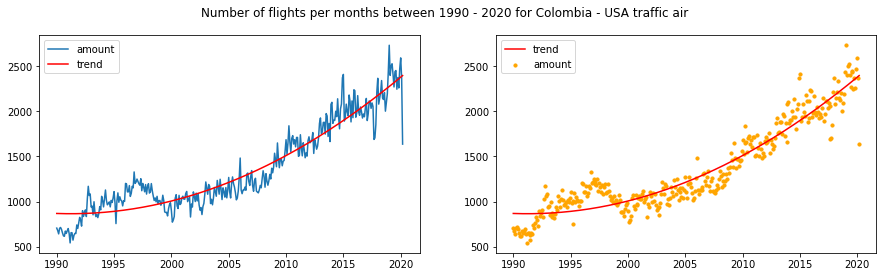

In [105]:
dep_serie_colombia = groupRegistersByAttributes(dep_colombia, ['Year', 'Month']).sum().reset_index()
dep_trend_colombia = findTrend(dep_serie_colombia.index, dep_serie_colombia['Total'], 2)
graphTotalPerMonth(dep_serie_colombia, 'Number of flights per months between 1990 - 2020 for Colombia - USA traffic air', dep_trend_colombia)

Trend: 


<IPython.core.display.Latex object>

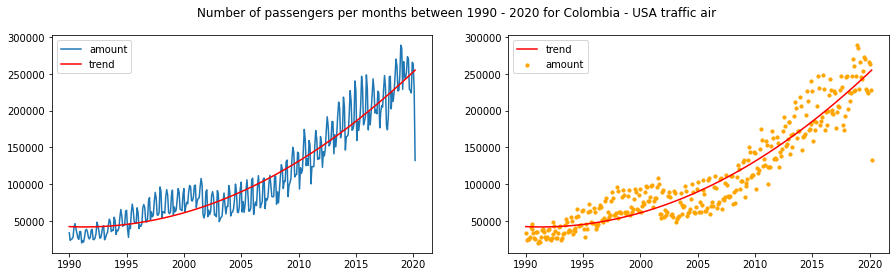

In [106]:
pass_serie_colombia = groupRegistersByAttributes(pass_colombia, ['Year', 'Month']).sum().reset_index()
dep_trend_colombia = findTrend(pass_serie_colombia.index, pass_serie_colombia['Total'], 2)
graphTotalPerMonth(pass_serie_colombia, 'Number of passengers per months between 1990 - 2020 for Colombia - USA traffic air', dep_trend_colombia)

### Trend for airports

In [107]:
def plotTrendPerAiport(df, iata_code, degree):
  df_colombia = df.copy()
  df_colombia = df_colombia[df_colombia['fg_apt'] == iata_code]
  df_colombia = groupRegistersByAttributes(df_colombia, ['Year', 'Month']).sum().reset_index()

  city = iata_df_colombia[iata_df_colombia['iata_code'] == iata_code]['region'].item()
  airport_name = iata_df_colombia[iata_df_colombia['iata_code'] == iata_code]['airport_name'].item()
  title = "%s, %s" % (airport_name, city)

  df_trend_colombia = findTrend(df_colombia.index, df_colombia['Total'], degree)
  graphTotalPerMonth(df_colombia, title, df_trend_colombia)

In [108]:
iata_df_colombia

,longitud,latitud,iata_code,airport_name,region,country,dep_amount,pass_amount
49,4.45,-75.77,AXM,El Edén International Airport,Armenia,Colombia,2517,332563
52,4.57,-72.98,BAC,Barranca de Upia Airport,"Barranca de Upia, Meta",Colombia,1,No info
99,4.70,-74.15,BOG,El Dorado International Airport,Bogotá,Colombia,451483,35692418
173,4.76,-75.96,CRC,Santa Ana Airport,Cartago,Colombia,15,5
181,10.44,-75.51,CTG,Rafael Núñez International Airport,Cartagena,Colombia,36133,3839562
237,7.02,-73.81,EJA,Yarigüies Airport,Barrancabermeja,Colombia,1,No info
240,6.22,-75.59,EOH,Olaya Herrera Airport,Medellín,Colombia,1,8
249,5.32,-72.38,EYP,El Alcaraván Airport,Yopal,Colombia,24,No info
260,1.59,-75.56,FLA,Gustavo Artunduaga Paredes Airport,"Florencia, Caquetá",Colombia,4,91
280,3.63,-70.32,GMC,Guerima Airport,Guerima,Colombia,2,124


Change the variable "airport" to see the trend of that airport, according to the IATA codes shown above. It can be also modified the degree to fit the model with. **This doesn't works in some cases because there is not a monthly time series of flights for that airport**

For flights

Trend: 


<IPython.core.display.Latex object>

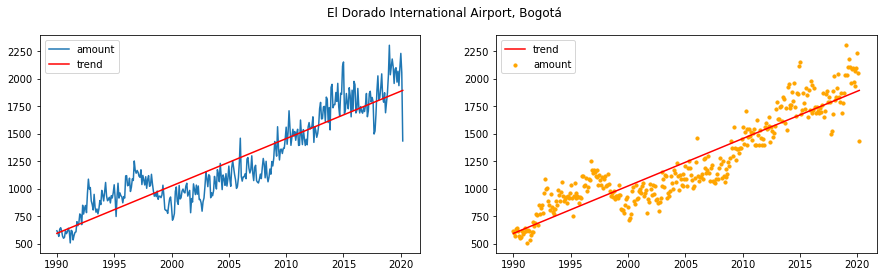

In [109]:
airport = 'BOG'
degree = 1
plotTrendPerAiport(dep_colombia, airport, degree)

Trend: 


<IPython.core.display.Latex object>

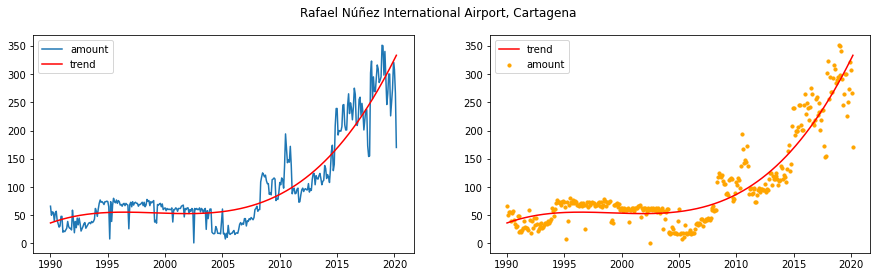

In [110]:
airport = 'CTG'
degree = 3
plotTrendPerAiport(dep_colombia, airport, degree)

For passengers

Trend: 


<IPython.core.display.Latex object>

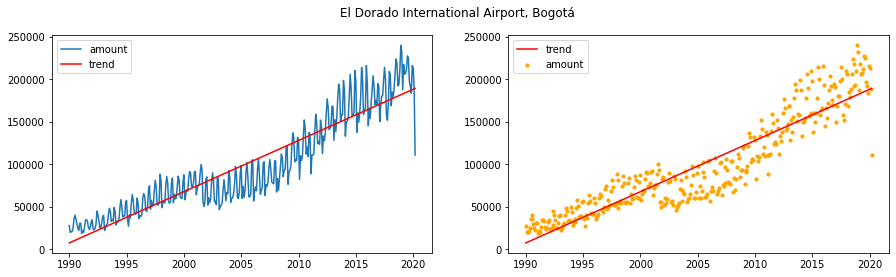

In [111]:
airport = 'BOG'
degree = 1
plotTrendPerAiport(pass_colombia, airport, degree)

Trend: 


<IPython.core.display.Latex object>

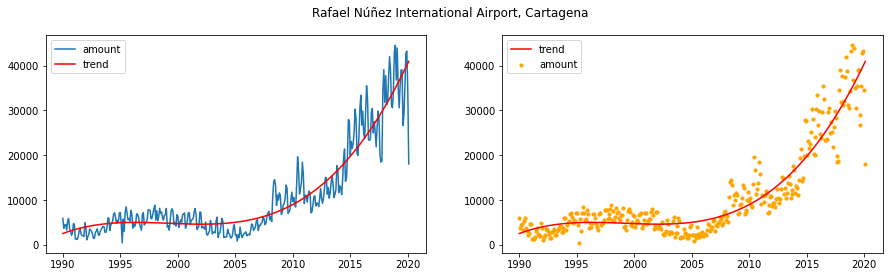

In [112]:
airport = 'CTG'
degree = 3
plotTrendPerAiport(pass_colombia, airport, degree)

### Basic statistics for flights and passengers in Colombia

In [113]:
dep_serie_colombia['Total'].describe()

count    363.00
mean    1355.42
std      486.26
min      542.00
25%     1010.50
50%     1177.00
75%     1708.00
max     2731.00
Name: Total, dtype: float64

In [114]:
pass_serie_colombia['Total'].describe()

count      363.00
mean    109946.80
std      67623.60
min      20111.00
25%      58964.50
50%      88892.00
75%     161055.00
max     289181.00
Name: Total, dtype: float64

## **Accidentality**

In [115]:
#As the dataset has several NaN values in some columns, we delete them
del accidentality["Flight #"]
del accidentality["Route"]
del accidentality["cn/In"]
del accidentality["Registration"]
del accidentality["Time"]
del accidentality["Ground"]

#Fix the date format
accidentality["Date"] = pd.to_datetime(accidentality["Date"])

#Add a new column with just the year of the accident for analysis
accidentality['Year'] = pd.DatetimeIndex(accidentality['Date']).year

#Add a new column for the accident survivals
accidentality['Survived'] = accidentality['Aboard'] - accidentality['Fatalities']
accidentality.Survived = np.where(accidentality.Survived < 0, 0, accidentality.Survived)

#Add a new column for the accident survivals Rates
accidentality['Survival Rate'] = 100 * (accidentality['Aboard'] - accidentality['Fatalities'])/ accidentality['Aboard']

100 * accidentality.isnull().sum()/len(accidentality)

Date            0.00
Location        0.38
Operator        0.34
Type            0.51
Aboard          0.42
Fatalities      0.23
Summary         7.40
Year            0.00
Survived        0.42
Survival Rate   0.46
dtype: float64

In [116]:
#Accident with most people aboard
maxAcc = accidentality['Aboard'].max()
accidentality.loc[accidentality['Aboard'] == maxAcc]

,Date,Location,Operator,Type,Aboard,Fatalities,Summary,Year,Survived,Survival Rate
2963,1977-03-27,"Tenerife, Canary Islands",Pan American World Airways / KLM,Boeing B-747-121 / Boeing B-747-206B,644.00,583.00,Both aircraft were diverted to Tenerife becaus...,1977,61.00,9.47


In [117]:
#Accident with most survivals
maxSurv = accidentality['Survived'].max()
accidentality.loc[accidentality['Survived'] == maxSurv]

,Date,Location,Operator,Type,Aboard,Fatalities,Summary,Year,Survived,Survival Rate
4645,1999-07-23,"Tokyo, Japan",All Nippon Airways,Boeing B-747,517.00,1.00,Two minutes after taking off from Haneda Airpo...,1999,516.00,99.81


In [118]:
#Accident with no fatallities
maxSurvRate = accidentality['Survival Rate'].max()
accidentality.loc[accidentality['Survival Rate'] == maxSurvRate]

,Date,Location,Operator,Type,Aboard,Fatalities,Summary,Year,Survived,Survival Rate
108,1926-10-21,English Channel,Imperial Airways,Handley Page W-10,12.00,0.00,The plane was on a flight from London to Paris...,1926,12.00,100.00
387,1936-03-05,"Near Tengya, China",China National Aviation Corporation,Ford 5-AT-D Tri-Motor,6.00,0.00,Crash landed in mountains during a snowstorm.,1936,6.00,100.00
889,1947-10-08,"Near El Paso, Texas",American Airlines,Douglas DC-4,54.00,0.00,"While cruising at 8,000 ft. in clear weather, ...",1947,54.00,100.00
897,1947-11-11,"Gallup, New Mexico",American Airlines,Douglas DC-6,25.00,0.00,The aircraft was on a flight from San Francisc...,1947,25.00,100.00
1265,1953-05-25,"Amsterdam, Netherlands",KLM Royal Dutch Airlines,Convair CV-240-4,34.00,0.00,While taking off the plane reached a height of...,1953,34.00,100.00
1359,1955-01-19,"Des Moines, Iowa",United Air Lines,Convair CV-340,39.00,0.00,Almost complete loss of elevator control and s...,1955,39.00,100.00
1440,1956-09-09,"Bartlesville, Oklahoma",Continental Airlines,Douglas DC-3 / Cessna 170B,18.00,0.00,Midair collision. Both planes landed safely. F...,1956,18.00,100.00
1443,1956-10-16,Over the PacifiOcean,Pan American World Airways,Boeing 377 Stratocruiser,31.00,0.00,The aircraft ditched into the PacifiOcean whil...,1956,31.00,100.00
1610,1959-06-30,"Ishikawa City, Ryukyu Island, Okinawa",Military - U.S. Air Force,North American F-100D-25NA,1.00,0.00,The pilot ejected and parachuted safely from t...,1959,1.00,100.00
1837,1963-02-28,"Boston, Massachusetts",Eastern Air Lines,Douglas DC-7,26.00,0.00,"With engines idling, a girl ran into the No. 2...",1963,26.00,100.00


In [119]:
#Accident with most fatalities
maxFat = accidentality['Fatalities'].max()
accidentality.loc[accidentality['Fatalities'] == maxFat]

,Date,Location,Operator,Type,Aboard,Fatalities,Summary,Year,Survived,Survival Rate
2963,1977-03-27,"Tenerife, Canary Islands",Pan American World Airways / KLM,Boeing B-747-121 / Boeing B-747-206B,644.00,583.00,Both aircraft were diverted to Tenerife becaus...,1977,61.00,9.47


### **Airplanes Crashes for year**

In [120]:
years = accidentality.groupby('Year').size().reset_index(name='Counts')

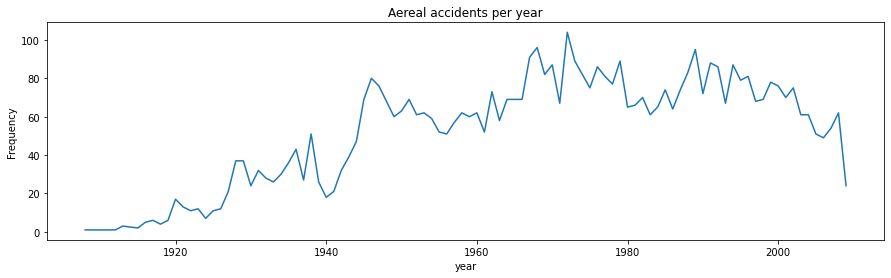

In [121]:
plt.plot(years['Year'], years['Counts'])
plt.title('Aereal accidents per year')
plt.xlabel('year')
plt.ylabel('Frequency')
plt.show()

In [122]:
#The year with most crashes was 1972 with 104 crashes
max_year = years['Counts'].max()
years.loc[years['Counts'] == max_year]

,Year,Counts
60,1972,104


In [123]:
pd.set_option('display.max_rows', None)
accidentality

,Date,Location,Operator,Type,Aboard,Fatalities,Summary,Year,Survived,Survival Rate
0,1908-09-17,"Fort Myer, Virginia",Military - U.S. Army,Wright Flyer III,2.00,1.00,"During a demonstration flight, a U.S. Army fly...",1908,1.00,50.00
1,1912-07-12,"AtlantiCity, New Jersey",Military - U.S. Navy,Dirigible,5.00,5.00,First U.S. dirigible Akron exploded just offsh...,1912,0.00,0.00
2,1913-08-06,"Victoria, British Columbia, Canada",Private,Curtiss seaplane,1.00,1.00,The first fatal airplane accident in Canada oc...,1913,0.00,0.00
3,1913-09-09,Over the North Sea,Military - German Navy,Zeppelin L-1 (airship),20.00,14.00,The airship flew into a thunderstorm and encou...,1913,6.00,30.00
4,1913-10-17,"Near Johannisthal, Germany",Military - German Navy,Zeppelin L-2 (airship),30.00,30.00,Hydrogen gas which was being vented was sucked...,1913,0.00,0.00
5,1915-03-05,"Tienen, Belgium",Military - German Navy,Zeppelin L-8 (airship),41.00,21.00,Crashed into trees while attempting to land af...,1915,20.00,48.78
6,1915-09-03,"Off Cuxhaven, Germany",Military - German Navy,Zeppelin L-10 (airship),19.00,19.00,"Exploded and burned near Neuwerk Island, when...",1915,0.00,0.00
7,1916-07-28,"Near Jambol, Bulgeria",Military - German Army,Schutte-Lanz S-L-10 (airship),20.00,20.00,"Crashed near the Black Sea, cause unknown.",1916,0.00,0.00
8,1916-09-24,"Billericay, England",Military - German Navy,Zeppelin L-32 (airship),22.00,22.00,Shot down by British aircraft crashing in flames.,1916,0.00,0.00
9,1916-10-01,"Potters Bar, England",Military - German Navy,Zeppelin L-31 (airship),19.00,19.00,Shot down in flames by the British 39th Home D...,1916,0.00,0.00


### **Average Survival Rate per year**

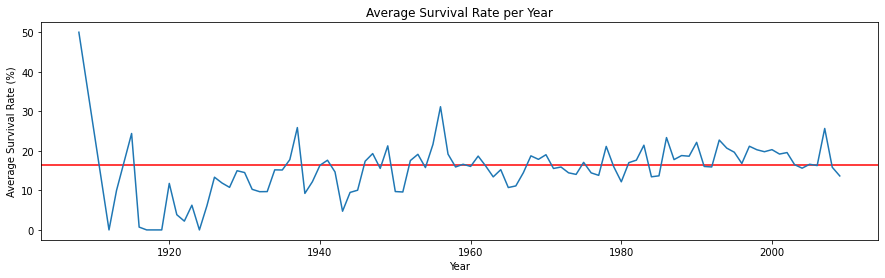

In [124]:
yearly_survival = accidentality[["Year","Survival Rate"]].groupby(accidentality["Year"]).agg('mean')
data_mean = accidentality["Survival Rate"].mean()
plt.ylabel("Average Survival Rate (%)")
plt.xlabel("Year")
plt.title("Average Survival Rate per Year")
plt.axhline(y=data_mean, color='r', linestyle='-')
plt.plot(yearly_survival['Year'], yearly_survival['Survival Rate'])
plt.show()

### **Airplanes types with more accidentality**

In [125]:
airplanes = accidentality.groupby('Type').size().reset_index(name='Counts')
ordered_airplanes = airplanes.sort_values(by='Counts', ascending=False)

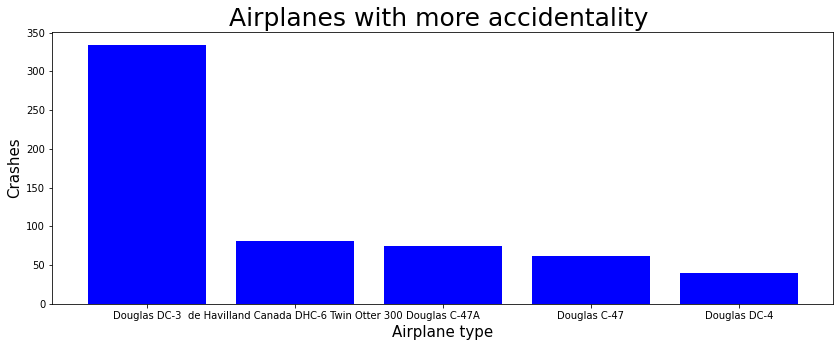

In [126]:
plt.figure(figsize=(14, 5))
plt.bar(ordered_airplanes['Type'].head(), ordered_airplanes['Counts'].head(), width=0.8, color='blue')
plt.ylabel('Crashes', fontsize=15)
plt.xlabel('Airplane type', fontsize=15)
plt.title('Airplanes with more accidentality ', fontsize=25)
plt.rcParams.update({'font.size': 10})
plt.show()

## **References**

The datasets, extracted from Kaggle.com can be found here:

* Airplane crashes and fatalities since 1908: https://drive.google.com/file/d/1ZLzPbEiaiUJHmv5S_d41F6M4zm-VJBKb/view?usp=sharing
* IATA codes: https://drive.google.com/file/d/1frfo2N_o6MUjDErdAWTY3Uf9Hbw9Z-We/view?usp=sharing
* International report departures: https://drive.google.com/file/d/1POPWTFPdEsh1jeWsvSCP0Kt36qYxoGpx/view?usp=sharing
* International report passengers: https://drive.google.com/file/d/1wTGSZBqWxrTYqHJo4roIBxbbh8QHZeIu/view?usp=sharinghttps://drive.google.com/file/d/1wTGSZBqWxrTYqHJo4roIBxbbh8QHZeIu/view?usp=sharing
* US aiport locations: https://drive.google.com/file/d/1fE93sqjRm8LNo5A3sq4RGjfUrBx-aThi/view?usp=sharing
* Foreign aiport locations: https://drive.google.com/file/d/1zQ4SoF1CFlqm4gbHwZJA92pkxKKpwegL/view?usp=sharing
